# Insights from Ford GoBike Bicycle Sharing System

> https://www.fordgobike.com/

Ford GoBike is a bike share system operating in the Bay Area, with thousands of public bikes for use across San Francisco, East Bay and San Jose.

Ford periodically publishes data of users' trips [here](https://s3.amazonaws.com/fordgobike-data/index.html)

In [200]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

from bokeh.plotting import figure, output_notebook, show # bokeh plotting library
# We'll show the plots in the cells of this notebook
output_notebook()

sns.set(color_codes=True)
sns.set(rc={'figure.figsize':(12.5,9.7)})

Loading BokehJS ...

In [201]:
%time

df = pd.read_csv('./2017-fordgobike-tripdata.csv')
df1 = pd.read_csv('201801-fordgobike-tripdata.csv')
df2 = pd.read_csv('201802-fordgobike-tripdata.csv')
df3 = pd.read_csv('201803-fordgobike-tripdata.csv')
df4 = pd.read_csv('201804-fordgobike-tripdata.csv')
df5 = pd.read_csv('201805-fordgobike-tripdata.csv')

CPU times: user 7 µs, sys: 1 µs, total: 8 µs
Wall time: 14.1 µs


In [202]:
df = pd.concat([df, df1, df2, df3, df4, df5], sort=True)

In [203]:
# df.to_csv('./fordgobike.csv')

In [204]:
list(df)

['bike_id',
 'bike_share_for_all_trip',
 'duration_sec',
 'end_station_id',
 'end_station_latitude',
 'end_station_longitude',
 'end_station_name',
 'end_time',
 'member_birth_year',
 'member_gender',
 'start_station_id',
 'start_station_latitude',
 'start_station_longitude',
 'start_station_name',
 'start_time',
 'user_type']

In [205]:
df.shape

(1142896, 16)

In [206]:
df.member_gender.value_counts()

Male      774554
Female    241213
Other      14759
Name: member_gender, dtype: int64

We are only interesting in users whose genders are known.

In [207]:
df = df[df.member_gender.isin(['Male', 'Female'])]
df.head()

,bike_id,bike_share_for_all_trip,duration_sec,end_station_id,end_station_latitude,end_station_longitude,end_station_name,end_time,member_birth_year,member_gender,start_station_id,start_station_latitude,start_station_longitude,start_station_name,start_time,user_type
0,96,NaN,80110,43,37.778768,-122.415929,San Francisco Public Library (Grove St at Hyde...,2018-01-01 15:12:50.2450,1987.0,Male,74,37.776435,-122.426244,Laguna St at Hayes St,2017-12-31 16:57:39.6540,Customer
1,88,NaN,78800,96,37.766210,-122.426614,Dolores St at 15th St,2018-01-01 13:49:55.6170,1965.0,Female,284,37.784872,-122.400876,Yerba Buena Center for the Arts (Howard St at ...,2017-12-31 15:56:34.8420,Customer
4,3167,NaN,43603,247,37.867789,-122.265896,Fulton St at Bancroft Way,2018-01-01 02:29:57.5710,1997.0,Female,239,37.868813,-122.258764,Bancroft Way at Telegraph Ave,2017-12-31 14:23:14.0010,Subscriber
6,3539,NaN,4507,259,37.866249,-122.299371,Addison St at Fourth St,2018-01-01 01:04:35.6190,1991.0,Female,259,37.866249,-122.299371,Addison St at Fourth St,2017-12-31 23:49:28.4220,Customer
12,2311,NaN,2183,24,37.789677,-122.390428,Spear St at Folsom St,2018-01-01 00:29:18.7430,1990.0,Male,67,37.776639,-122.395526,San Francisco Caltrain Station 2 (Townsend St...,2017-12-31 23:52:55.5810,Subscriber


Let's convert our time columns to datetime so we can operate on them using pandas datetime functions

In [208]:
df['start_time'] = pd.to_datetime(df['start_time'])
df['end_time'] = pd.to_datetime(df['end_time'])
df = df.sort_values(by='start_time')

Let's get an idea of the spread of durations

In [209]:
df['duration_sec'].describe()

count    1.015767e+06
mean     7.863350e+02
std      2.229480e+03
min      6.100000e+01
25%      3.520000e+02
50%      5.430000e+02
75%      8.260000e+02
max      8.625200e+04
Name: duration_sec, dtype: float64

Let's add columns for distances and durations in hours for future use.

In [210]:
from math import sin, cos, sqrt, atan2, radians

def distance(p1, p2):
    """Takes points in [lon,lat] form and returns the distance in km between them."""
    # approximate radius of earth in km
    R = 6373.0

    lon1 = radians(abs(p1[0]))
    lat1 = radians(abs(p1[1]))
    lon2 = radians(abs(p2[0]))
    lat2 = radians(abs(p2[1]))

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    return R * c

In [211]:
df['distance_km'] = df.apply(lambda i: distance([i['start_station_longitude'],i['start_station_latitude']],
                            [i['end_station_longitude'],i['end_station_latitude']]), axis=1)

In [212]:
df['duration_hr'] = df.duration_sec / 3600

## Map the Bay Area using trip start locations

### Ford GoBike Stations

A station is the row of bikes that can be found throughout the Bay Area. There are 550 stations across San Francisco, the East Bay and San Jose. They are solar powered, and each station consists of a variable number of bike docking ports.

<img src='./stations-map.png' />
<br/>
<center><em>Ford GoBike Stations in the San Francisco Bay Area (Source: <a href="https://member.fordgobike.com/map/">website</a>)</em></center>

Let's find longitude and latitudes range for start and end locations

In [213]:
print(np.min(df['start_station_longitude']), np.min(df['start_station_latitude']))
print(np.max(df['start_station_longitude']), np.max(df['start_station_latitude']))

print(np.min(df['end_station_longitude']), np.min(df['end_station_latitude']))
print(np.max(df['end_station_longitude']), np.max(df['end_station_latitude']))

-122.444292605 37.3128540429
-121.8741186 37.8802224459
-122.444292605 37.3128540429
-121.8741186 37.8802224459


Let's define a base plot

In [214]:
BayArea = x_range, y_range = ((-122.44429260492323, -121.8741186), (37.3172979, 37.88022244590679))

plot_width = int(1000)
plot_height = int(plot_width//1.2)

def base_plot(tools='pan, wheel_zoom, reset', plot_width=plot_width, plot_height=plot_height, **plot_args):
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
              x_range=x_range, y_range=y_range, outline_line_color=None,
              min_border=0, min_border_left=0, min_border_right=0,
              min_border_top=0, min_border_bottom=0, **plot_args)
    
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    return p

options = dict(line_color=None, fill_color='blue', size=5)

Here is a start locations scatter plot

In [215]:
import datashader as ds
from datashader import transfer_functions as tr_fns
from datashader.colors import Greys9
Greys9_r = list(reversed(Greys9))[:2]

In [216]:
%%time
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range)
agg = cvs.points(df, 'start_station_longitude', 'start_station_latitude')
img = tr_fns.shade(agg, cmap=["white", 'darkblue'], how='linear')

img

CPU times: user 31.9 ms, sys: 10.1 ms, total: 42 ms
Wall time: 43.8 ms


### Trip Start Stations

In [217]:
from datashader.bokeh_ext import InteractiveImage
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9, Hot, viridis, inferno
from IPython.core.display import HTML, display

background = "black"
export = partial(export_image, export_path="export", background=background)
cm = partial(colormap_select, reverse=(background=="black"))

def create_start_image(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'start_station_longitude', 'start_station_latitude')
    img = tr_fns.shade(agg, cmap=Hot, how='eq_hist')
    return tr_fns.dynspread(img, threshold=0.5, max_px=4)

In [218]:
p = base_plot(title='Start Stations by Frequency', background_fill_color=background)
# export(create_start_image(*BayArea), 'start_stations')
InteractiveImage(p, create_start_image)

## Trip End Locations

In [219]:
def create_end_image(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'end_station_longitude', 'end_station_latitude')
    img = tr_fns.shade(agg, cmap=Hot, how='eq_hist')
    return tr_fns.dynspread(img, threshold=0.5, max_px=4)

In [220]:
p = base_plot(title='End Stations by Frequency', background_fill_color=background)
# export(create_end_image(*BayArea), 'end_stations')
InteractiveImage(p, create_end_image)

#### Let's take a look at the trip with the longest duration

In [221]:
df[df.duration_sec == max(df.duration_sec)]

,bike_id,bike_share_for_all_trip,duration_sec,end_station_id,end_station_latitude,end_station_longitude,end_station_name,end_time,member_birth_year,member_gender,start_station_id,start_station_latitude,start_station_longitude,start_station_name,start_time,user_type,distance_km,duration_hr
120423,1214,NaN,86252,18,37.850222,-122.260172,Telegraph Ave at Alcatraz Ave,2017-11-19 12:14:05.244,1993.0,Female,245,37.870348,-122.267764,Downtown Berkeley BART,2017-11-18 12:16:33.230,Customer,2.335747,23.958889


The 2.3km trip took 24 hours supposedly. This might be due to a booking error or a customer mistake.

#### Let's take a look at the trip with the longest distance 

In [222]:
df[df.distance_km == max(df.distance_km)]

,bike_id,bike_share_for_all_trip,duration_sec,end_station_id,end_station_latitude,end_station_longitude,end_station_name,end_time,member_birth_year,member_gender,start_station_id,start_station_latitude,start_station_longitude,start_station_name,start_time,user_type,distance_km,duration_hr
7900,319,No,21836,303,37.352601,-121.905733,San Pedro St at Hedding St,2018-03-29 20:29:44.284,1974.0,Female,16,37.79413,-122.39443,Steuart St at Market St,2018-03-29 14:25:47.670,Customer,65.329756,6.065556


Interestingly, what seems to be likely the same customer performed two 1.5 hour journeys exactly a month apart from `Bay Pl at Vernon St` to `San Jose Diridon Station`. Let's map these two locations:

In [223]:
locs = df[df.distance_km == max(df.distance_km)]
lon1 = locs.iloc[0, :]['start_station_longitude']
lat1 = locs.iloc[0, :]['start_station_latitude']
lon2 = locs.iloc[0, :]['end_station_longitude']
lat2 = locs.iloc[0, :]['end_station_latitude']

df_longest = pd.DataFrame(data={'start_station_longitude': [lon1, lon2], 'start_station_latitude': [lat1, lat2]})

def create_longest_trip_image(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df_longest, 'start_station_longitude', 'start_station_latitude')
    img = tr_fns.shade(agg, cmap=inferno, how='eq_hist')
    return tr_fns.dynspread(img, threshold=0.5, max_px=4)

In [224]:
p = base_plot(title="Longest trip: from Steuart St to San Pedro St", background_fill_color=background)
# export(create_image(*BayArea), "BayArea_end_locs")
InteractiveImage(p, create_longest_trip_image)

**The rider travelled 65.329756 km from one end of the Bay to the other.**

<img src='./start_to_end.png' />
<br/>
<center><em>Trips from start to end stations</em></center>

<img src='./stations_by_duration.png' />
<br/>
<center><em>Trips by Duration</em></center>

## Trip durations based on gender

In [225]:
df['month'] = df.start_time.dt.to_period('M')

[None]

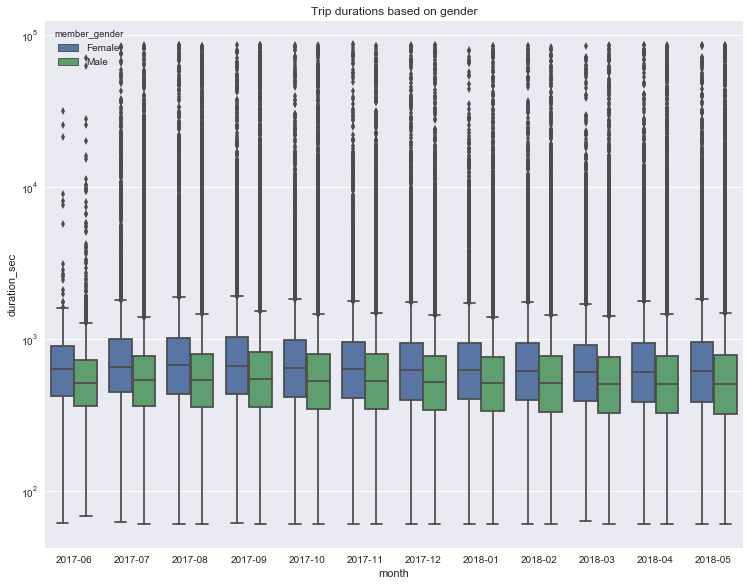

In [226]:
ax = sns.boxplot(x='month', y='duration_sec', hue='member_gender', data=df)
ax.set_title('Trip durations based on gender')
ax.set(yscale='log')

## Trip speeds based on gender

Let's create a column of speed in kilometers per hour

In [227]:
df['speed'] = df.distance_km / df.duration_hr

Text(0.5,1,'Trip speeds based on gender')

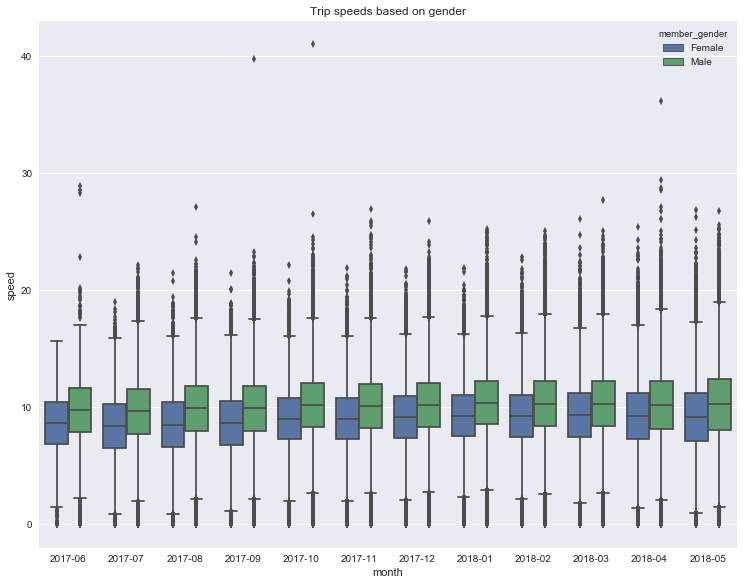

In [228]:
ax = sns.boxplot(x='month', y='speed', hue='member_gender', data=df)
ax.set_title('Trip speeds based on gender')

Text(0.5,1,'Trip speeds based on gender distinguished by user type')

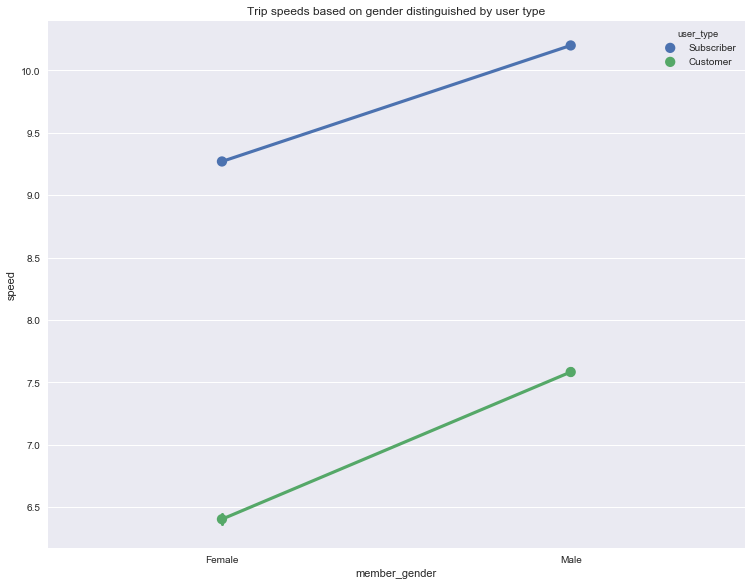

In [229]:
ax = sns.pointplot(x='member_gender', y='speed', hue='user_type', data=df);
ax.set_title('Trip speeds based on gender distinguished by user type')

## Subscribers vs Customers

Subscribers are cyclers who are subscribed to some plan, while customers are cyclers who embark on single rides. See https://www.fordgobike.com/pricing for more details.

## Trip speeds based on user type

Text(0.5,1,'Trip speeds based on user type')

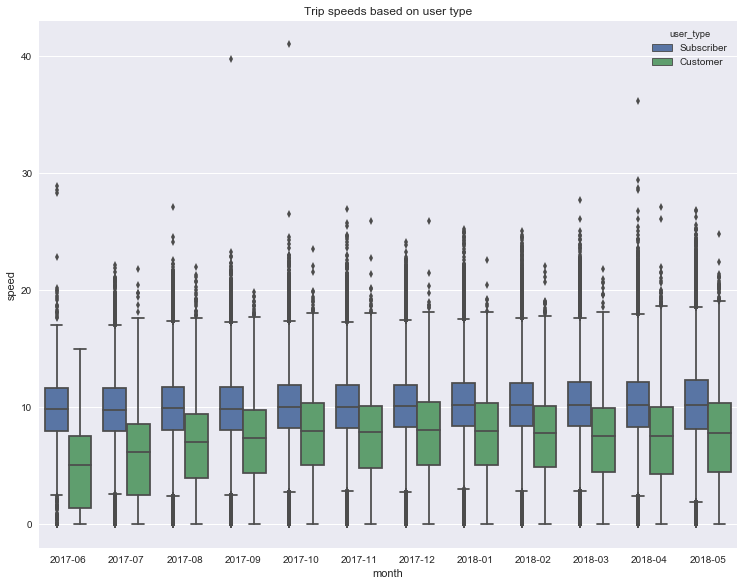

In [230]:
ax = sns.boxplot(x='month', y='speed', hue='user_type', data=df)
ax.set_title('Trip speeds based on user type')

Subscribers generally cycle faster than customers. Let's take a look at the distances travelled by each group.

Text(0.5,1,'Trip speeds based on user type distinguished by gender')

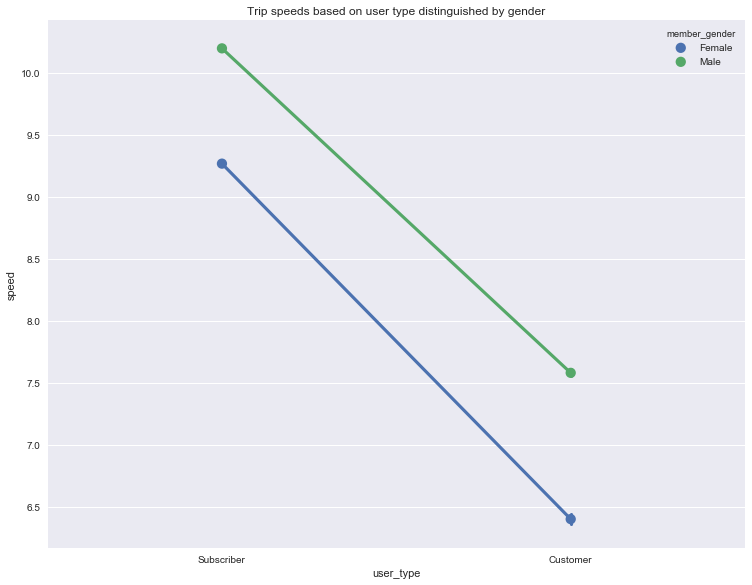

In [233]:
ax = sns.pointplot(x="user_type", y="speed", hue="member_gender", data=df)
ax.set_title('Trip speeds based on user type distinguished by gender')

## Trip durations based on user type

[None]

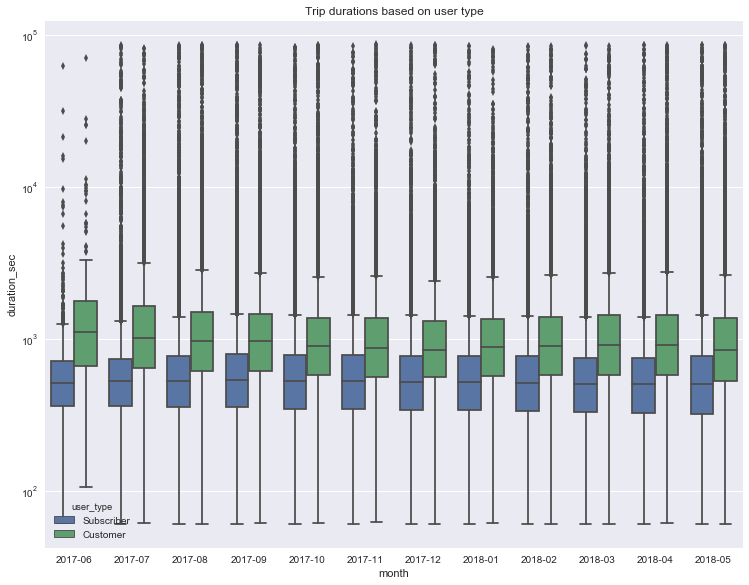

In [234]:
ax = sns.boxplot(x='month', y='duration_sec', hue='user_type', data=df)
ax.set_title('Trip durations based on user type')
ax.set(yscale='log')

**Customers appear to travel longer distances than subscribers. We might conclude that customers are slower than subscribers because they travel longer distances on average.**